In [17]:
import os
import numpy as np
import matplotlib.pyplot as plt
import imageio
from skimage import color
from skimage import io
from skimage import restoration
from matplotlib.pyplot import imshow
import skimage
import scipy.ndimage
from skimage.measure import compare_ssim as ssim
%matplotlib inline

# Metodos Auxiliares

In [2]:
# Metodos para printar as imagens
def ishow(img):
    plt.figure(figsize=(20,13)) 
    plt.imshow(np.asarray(abs(img),np.uint8), cmap='gray')
    plt.axis('off')
    
# Metodo para printar com o contraste ajustado    
def ishow_reajustado(img):
    plt.figure(figsize=(20,13)) 
    tmp = abs(img)
    tmp = (tmp/np.max(tmp))*255
    plt.imshow(np.asarray(tmp,np.uint8), cmap='gray')
    plt.axis('off')

In [3]:
# Calcula RMSE
def rmse(img, img1):
    img = np.asarray(img,dtype=np.uint8)
    img1 = np.asarray(img1,dtype=np.uint8)
    return np.sqrt(((img - img1)**2).mean())
    

In [4]:
# Para fazer o Filtro Gaussiano
def gaussian(x, mu, sig):
    return np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))
def filtro_gaussiano(w,h,sig):
    filtro = np.zeros((w,h))
    for i in range(0,w):
        for j in range(0,h):
            x = np.ceil(i-w/2)
            y = np.ceil(j-h/2)
            bla = np.sqrt(x*x + y*y)
            filtro[i][j] = gaussian(bla,0,sig)
    return filtro/np.sum(filtro)

In [19]:
def filtra_imagem(img,tipo_de_filtro, param=None):
    """
Filtra Imagem de Acordo com o tipo escolhido

img: numpy array da imagem
tipo_de_filtro: 0-gaussiano 1-bilateral 2-wavelet 3-total_variance_chambolle
param: parametro varia de acordo com metodo escolhido(olhar funcao), OPCIONAL
    valores default foram escolhidos usando o mrse

Os valores padrão foram definidos usando a imagem "cavalo_funkeiro" no limiar onde o SSIM ~= 0.84

return: imagem filtrada
"""

    img_convolucionada = img
    if(tipo_de_filtro == 0): #gaussiano
        if param is None:
            param = 1.95
        img_convolucionada = scipy.ndimage.gaussian_filter(img, param)
    elif(tipo_de_filtro == 1): #bilateral
        if param is None:
            param = 2.8
        img_convolucionada = skimage.restoration.denoise_bilateral(img, sigma_spatial=param,multichannel=False)
        img_convolucionada = ((img_convolucionada)/np.max(img_convolucionada)*255)
    elif(tipo_de_filtro == 2): #wavelet
        if param is None:
            param = 0.08
        img_convolucionada = skimage.restoration.denoise_wavelet(img, sigma=param)
        img_convolucionada = ((img_convolucionada)/np.max(img_convolucionada)*255)
    elif(tipo_de_filtro == 3): #total variance chambolle
        if param is None:
            param = 0.13
        img_convolucionada = skimage.restoration.denoise_tv_chambolle(img, weight=param)
        img_convolucionada = ((img_convolucionada)/np.max(img_convolucionada)*255)
    return img_convolucionada

In [166]:
def getCharCode(char):
    if len(char)!=1:
        return -1
    code = ord(char)
    if code>=32 and code<=127:
        return code - 32
    return -1

In [181]:
def getCharFromCode(code):
    if code == -1 or len(code)!=1:
        return '?'
    return chr(code + 32)

## selecionando imagens

In [6]:
# Imagens Preprocessadas para branco e preto
imagensOriginais = os.listdir("./fotosPreProcessadas/")[:0:-1]
list.sort(imagensOriginais)
imagensOriginais = imagensOriginais[1:] # retira o arqyuvo .DS_STORE
imagensOriginais

['img1.png',
 'img10.png',
 'img11.png',
 'img12.png',
 'img13.png',
 'img14.png',
 'img15.png',
 'img16.png',
 'img17.png',
 'img18.png',
 'img19.png',
 'img2.png',
 'img20.png',
 'img21.png',
 'img3.png',
 'img4.png',
 'img5.png',
 'img6.png',
 'img7.png',
 'img8.png',
 'img9.png']

# Definicao das variaveis globais
nao as sobreescreva ao longo do script

In [547]:
#imagem usada ao longo do script
nome_arquivo_img_usada = imagensOriginais[1]
img = imageio.imread("./fotosPreProcessadas/" + nome_arquivo_img_usada)
mensagem_geral = "Voce ja sabe qual e, quando voce ver o meu sinal, ta na hora"
mensagem_geral = mensagem_geral.lower()
#Tipo de filtro
    #0 - gaussiano
    #1 - bilateral
    #2 - Wavelet 
    #3 - Total variation
tipo_de_filtro = 0

x_percentage = 80 #porcentagem que a mascara ocupa no eixo x da imagem
y_percentage = 80 #porcentagem que a mascara ocupa no eixo y da imagem

-21

## imagem Original

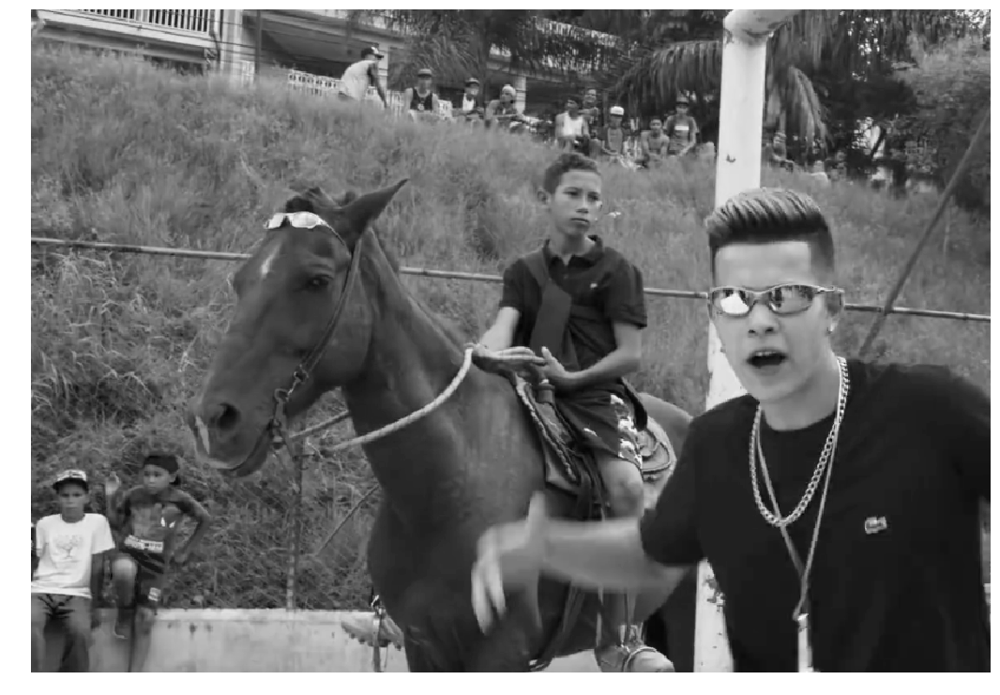

In [8]:
ishow(img)

## Espaço de frequencias da Imagem Original

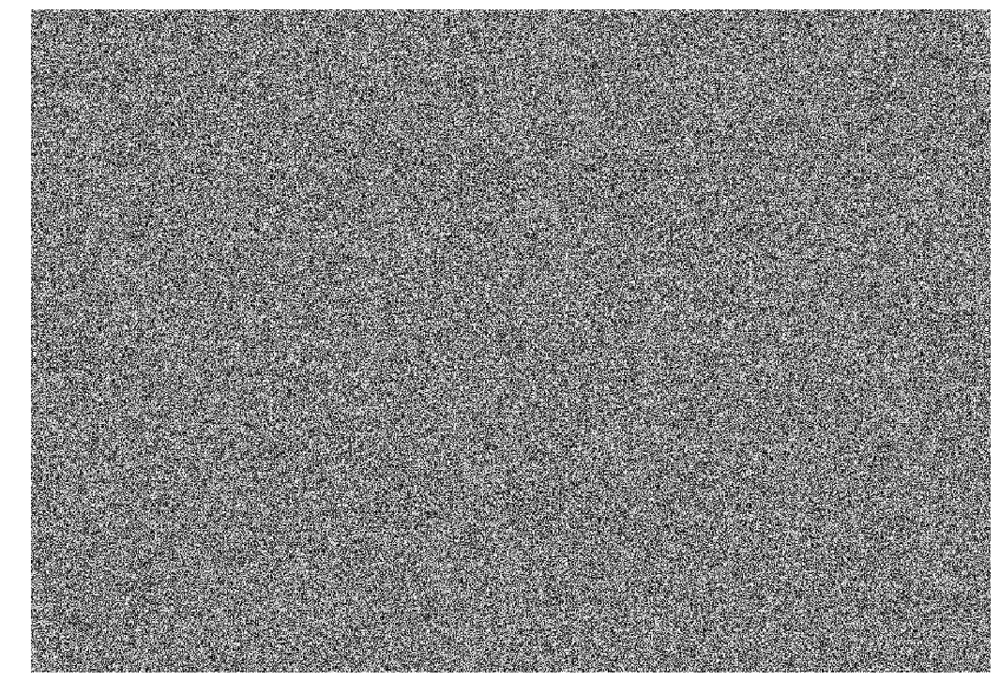

In [9]:
# FFT da imagem original
img_fft = np.fft.fftshift(np.fft.fft2(img))
ishow(img_fft)

## Visualização da convolução no domínio da imagem

0.84824956230605364

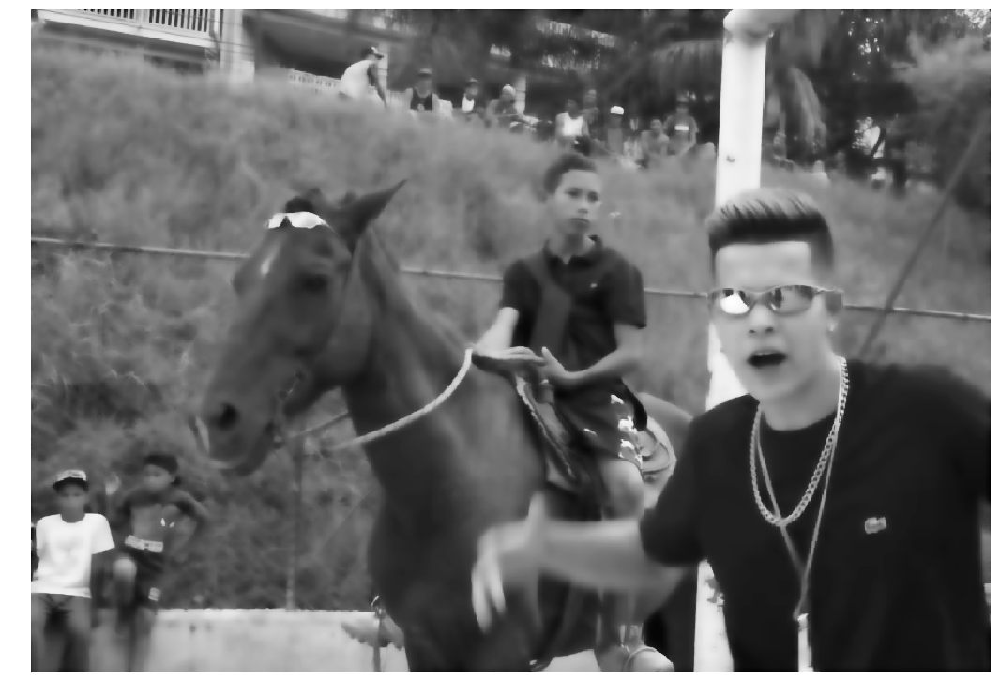

In [20]:
img_convolucionada = filtra_imagem(img, 1)
ishow(img_convolucionada)
ssim(img,np.asarray(img_convolucionada, np.uint8))

# Estudo do RMSE de acordo com os parametros das filtragens

In [21]:
gaussian_rmse = [[],[]] #0<x<4 , step = 0.1
for i in np.arange(0,4,0.1): #gaussian
    gaussian_rmse[0] += [i]
    gaussian_rmse[1] += [rmse(img,filtra_imagem(img,0,i))]
gaussian_rmse = np.asarray(gaussian_rmse)

In [22]:
bilateral_rmse = [[],[]]
for i in np.arange(0,4,0.1): #bilateral
    bilateral_rmse[0] += [i]
    bilateral_rmse[1] += [rmse(img,filtra_imagem(img,1,i))]
bilateral_rmse = np.asarray(bilateral_rmse)

In [23]:
wavelet_rmse = [[],[]]
for i in np.arange(0,0.2,0.01): #wavelet
    wavelet_rmse[0] += [i]
    wavelet_rmse[1] += [rmse(img,filtra_imagem(img,2,i))]
wavelet_rmse = np.asarray(wavelet_rmse)

In [24]:
tvchambolle_rmse = [[],[]]
for i in np.arange(0.01,0.4,0.01): #tvchambolle
    tvchambolle_rmse[0] += [i]
    tvchambolle_rmse[1] += [rmse(img,filtra_imagem(img,3,i))]
tvchambolle_rmse = np.asarray(tvchambolle_rmse)

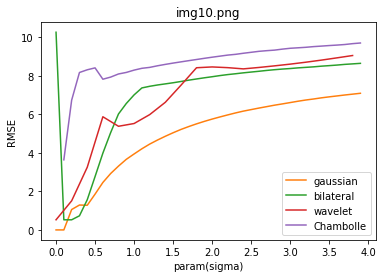

In [25]:
plt.plot(gaussian_rmse[0],gaussian_rmse[1], 'C1',label='gaussian')
plt.plot(bilateral_rmse[0],bilateral_rmse[1],'C2', label='bilateral')
plt.plot(np.asarray(wavelet_rmse[0])*20,wavelet_rmse[1], 'C3', label='wavelet')
plt.plot(np.asarray(tvchambolle_rmse[0])*10,tvchambolle_rmse[1], 'C4', label='Chambolle')

plt.title(nome_arquivo_img_usada)
plt.ylabel('RMSE')
plt.xlabel('param(sigma)')
plt.legend()
plt.show()

Note que multiplicamos as indices:
    - wavelet*20
    - tvchambolle*10
Assim com essa escala conseguimos visualizar melhor o gráfico

# Exemplo de falha do RMSE

7.15012117217


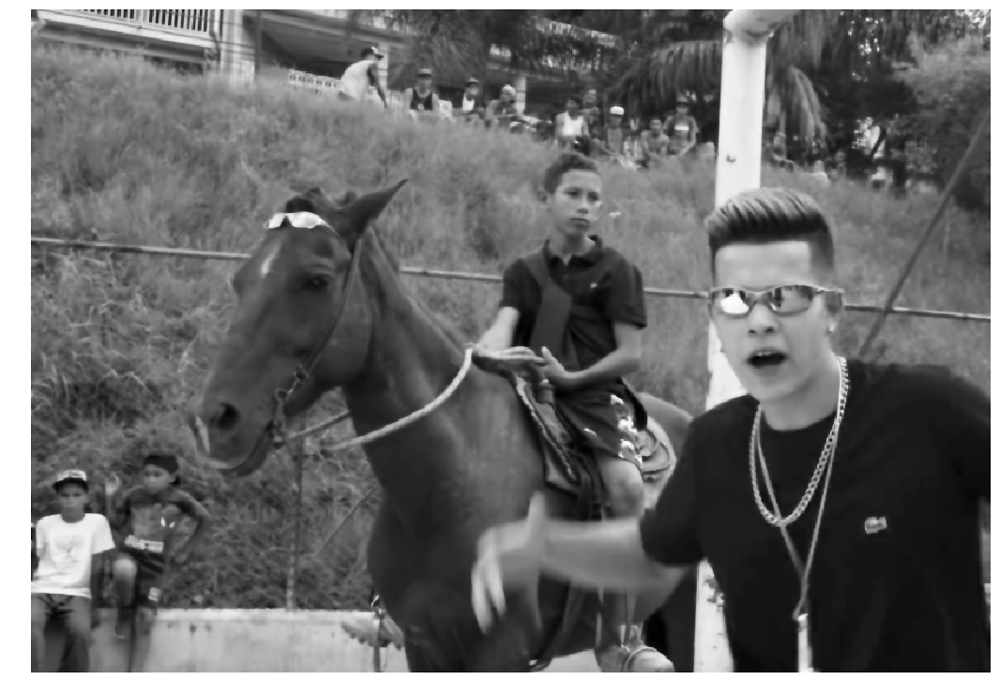

In [26]:
a = filtra_imagem(img,1,1.03)
print(rmse(a,img))
ishow(a)

7.14177304813


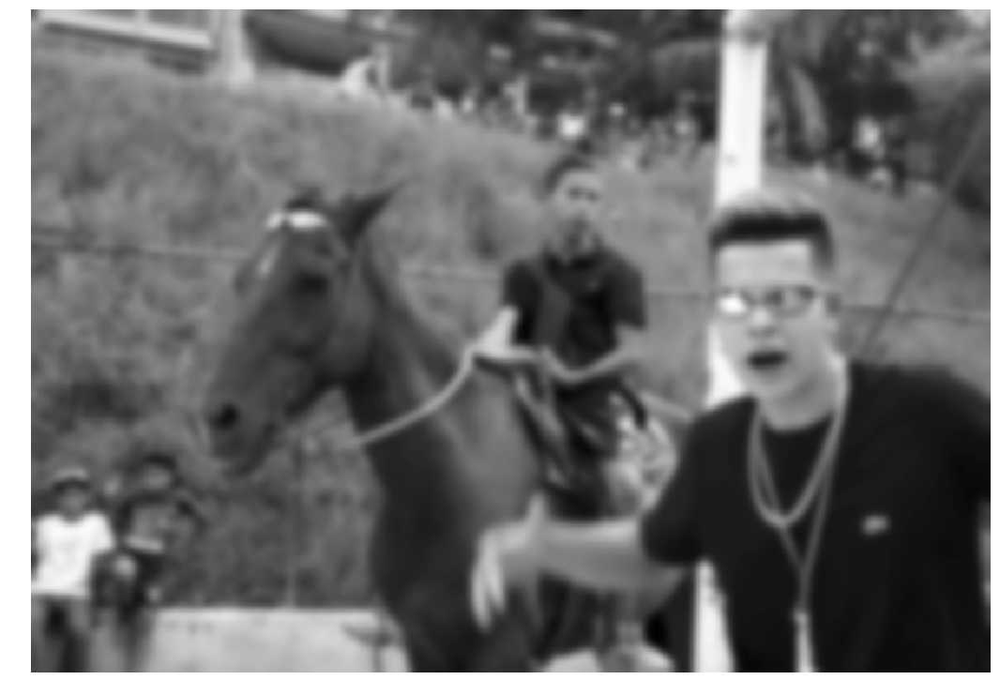

In [27]:
b = filtra_imagem(img,0,4)
print(rmse(b,img))
ishow(b)

- Note que as duas imagens acima tem o RMSE próximo de 7.1, e a primeira é claramente mais próxima da original. Por esse motivo tivemos que procurar uma outra métrica

# Testando Structural similarity index
Para isso, inicialmente, usaremos os mesmos filtros com os mesmos parametros no teste acima
- Note que quando mais próximo de 1, mais parecida com a imagem original

In [28]:
print("comparacao da imagem original com si mesma:")
print(ssim(img,img))

print("comparacao da imagem 'a', mais parecida visualmente:")
a = filtra_imagem(img,1,1.03)
print(ssim(np.asarray(a,np.uint8),img))

print("comparacao da imagem 'b', menos parecida visualmente:")
b = filtra_imagem(img,0,4)
print(ssim(np.asarray(b,np.uint8),img))



comparacao da imagem original com si mesma:
1.0
comparacao da imagem 'a', mais parecida visualmente:
0.969860381429
comparacao da imagem 'b', menos parecida visualmente:
0.677052759349


- Assim temos um resultado mais fiel a realidade

Zhou Wang; Bovik, A.C.; ,”Mean squared error: Love it or leave it? A new look at Signal Fidelity Measures,” Signal Processing Magazine, IEEE, vol. 26, no. 1, pp. 98-117, Jan. 2009.

# Estudo do Structural similarity index de acordo com os parametros das filtragens

In [29]:
gaussian_ssim = [[],[]] #0<x<4 , step = 0.1
for i in np.arange(0.1,4,0.1): #gaussian
    gaussian_ssim[0] += [i]
    gaussian_ssim[1] += [ssim(img,np.asarray(filtra_imagem(img,0,i),np.uint8))]
gaussian_ssim = np.asarray(gaussian_ssim)

In [30]:
bilateral_ssim = [[],[]]
for i in np.arange(0.1,4,0.1): #gaussian
    bilateral_ssim[0] += [i]
    bilateral_ssim[1] += [ssim(img,np.asarray(filtra_imagem(img,1,i),np.uint8))]
bilateral_ssim = np.asarray(bilateral_ssim)

In [31]:
wavelet_ssim = [[],[]]
for i in np.arange(0.01,0.2,0.01): #gaussian
    wavelet_ssim[0] += [i]
    wavelet_ssim[1] += [ssim(img,np.asarray(filtra_imagem(img,2,i),np.uint8))]
wavelet_ssim = np.asarray(wavelet_ssim)

In [32]:
tvchambolle_ssim = [[],[]]
for i in np.arange(0.01,0.4,0.01): #gaussian
    tvchambolle_ssim[0] += [i]
    tvchambolle_ssim[1] += [ssim(img,np.asarray(filtra_imagem(img,3,i),np.uint8))]
tvchambolle_ssim = np.asarray(tvchambolle_ssim)

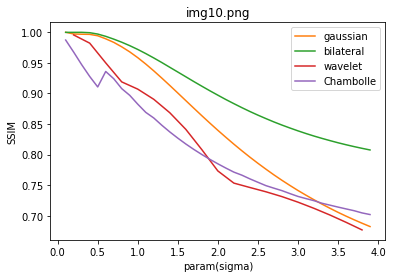

In [33]:

plt.plot(gaussian_ssim[0],gaussian_ssim[1], 'C1',label='gaussian')
plt.plot(bilateral_ssim[0],bilateral_ssim[1],'C2', label='bilateral')
plt.plot(np.asarray(wavelet_ssim[0])*20,wavelet_ssim[1], 'C3', label='wavelet')
plt.plot(np.asarray(tvchambolle_ssim[0])*10,tvchambolle_ssim[1], 'C4', label='Chambolle')

plt.title(nome_arquivo_img_usada)
plt.ylabel('SSIM')
plt.xlabel('param(sigma)')
plt.legend()
plt.show()

- lembrando que mudamos as escalas nos filtros wavelet e tv_chambolle

## SSIM ~ 0.84 com filtro gaussiano

0.845539628475


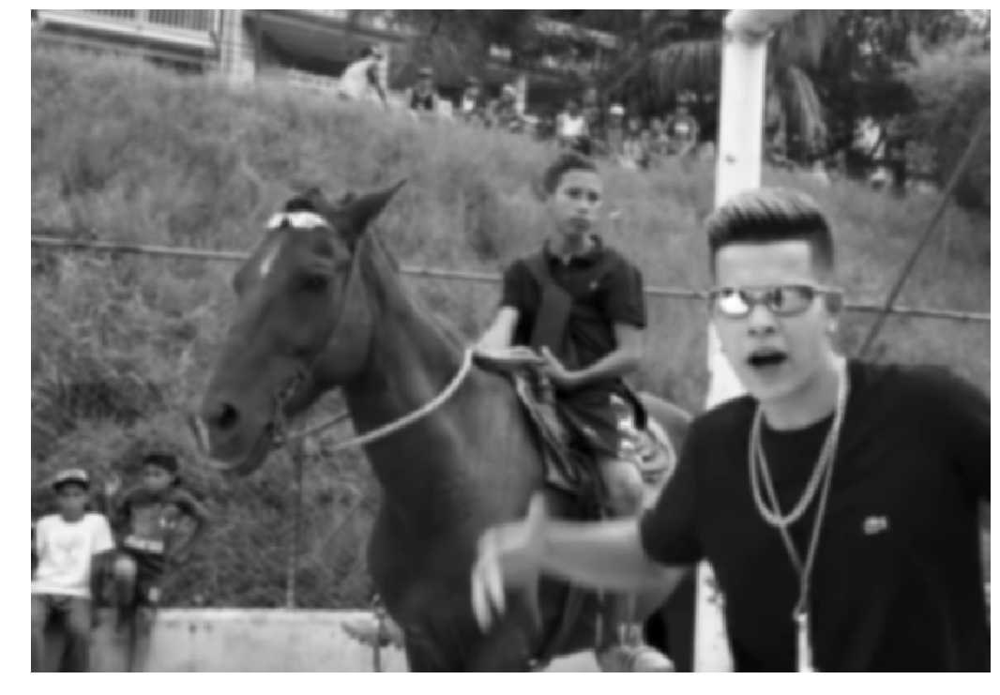

In [34]:
a = filtra_imagem(img,0,1.95) #filtro gaussiano
print(ssim(img,np.asarray(a,np.uint8)))
ishow(a)

## SSIM ~ 0.84 com filtro bilateral

0.848249562306


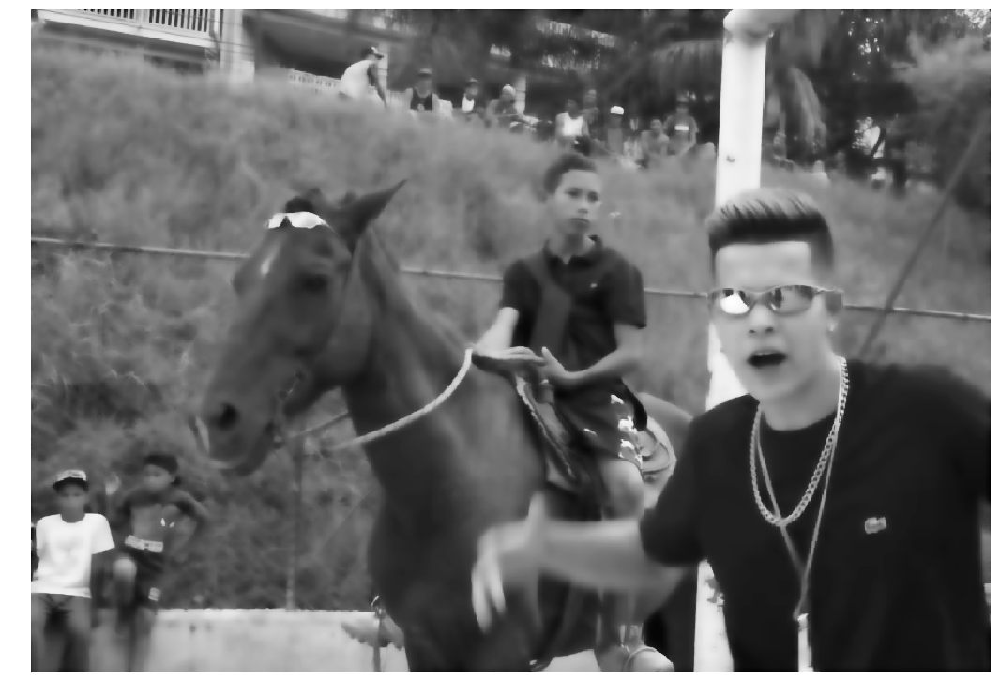

In [35]:
a = filtra_imagem(img,1,2.8) #filtro bilateral
print(ssim(img,np.asarray(a,np.uint8)))
ishow(a)

## SSIM ~ 0.84 com filtro wavelet

0.84123558855


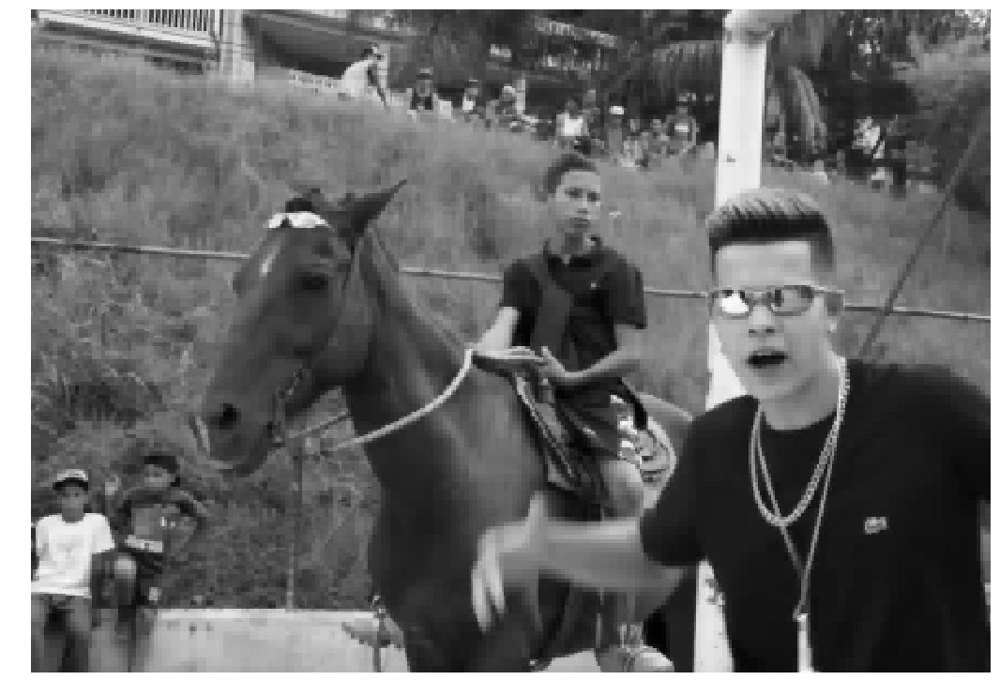

In [36]:
a = filtra_imagem(img,2,1.6/20) #filtro wavelet
print(ssim(img,np.asarray(a,np.uint8)))

ishow(a)


## SSIM ~ 0.84 com filtro total variance chambolle

0.84799272357


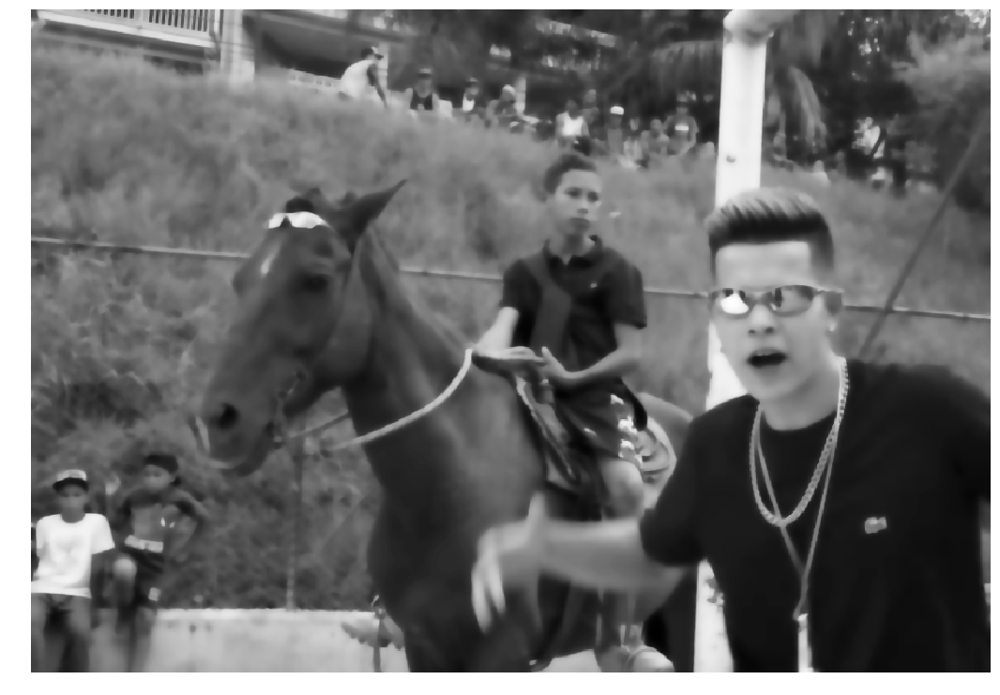

In [37]:
a = filtra_imagem(img,3,1.3/10) # filtro tv_chambolle
print(ssim(img,np.asarray(a,np.uint8)))
ishow(a)

### Podemos notar que ao usar a métrica Structural similarity index nossos resultados são mais fiéis visualmente falando. Por esse motivos usaremos ela a partir de agora

# Mascara utilizada no Espaço de Frequencias
A parte em amarelo(central) será o que ficará no domínio das frequencias, enquanto a parte e roxo(borda) é o que nos sobrará para preencher com nossas informações

In [550]:
def mascara_para_img(img,x_percentage,y_percentage):
    if(x_percentage>=100 or x_percentage<=0 or y_percentage>=100 or y_percentage<=0):
        print("mascara necessita de uma porcentagem valida para funcionar")
        raise AssertionError    
    #mascara do tamanho da imagem    
    mascara = np.zeros(img.shape)
    
    mascara_shape = (int(img.shape[0]*x_percentage/200),int(img.shape[1]*y_percentage/200))
    print(mascara_shape)
    print(img.shape)
    mascara[int(img.shape[0]/2) - mascara_shape[0]:int(img.shape[0]/2) + mascara_shape[0],int(img.shape[1]/2)- mascara_shape[1]:int(img.shape[1]/2) + mascara_shape[1]] = 1
    b = -(a-1)
    return np.asarray(mascara,np.uint8)

(242, 350)
(606, 877)


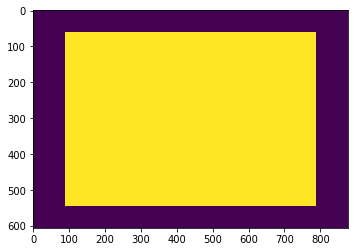

In [551]:
mascara = mascara_para_img(img,x_percentage,y_percentage)
imshow(mascara)

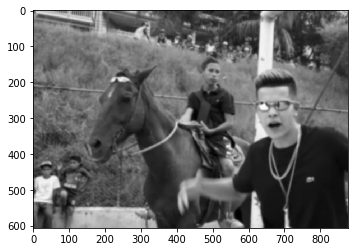

In [552]:
img_convolucionada = filtra_imagem(img, 0)
imshow(img_convolucionada, cmap='gray')

# Espaço de Frequencias com a mascara aplicada

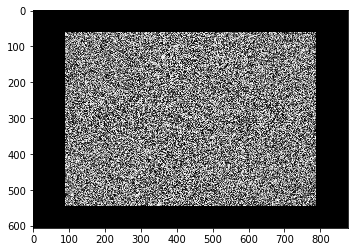

In [553]:
img_convolucionada_fft = np.fft.fftshift(np.fft.fft2(img_convolucionada))
img_convolucionada_fft_mascara = img_convolucionada_fft*mascara
imshow(np.asarray(abs(img_convolucionada_fft_mascara),np.uint8),cmap='gray')

## Colocando o tamanho em % da mascara no index [0][0]

In [554]:
img_convolucionada_fft_mascara[0][0] = x_percentage/100
img_convolucionada_fft_mascara[0][1] = y_percentage/100
mascara[0][0] = 1 #Inutiliza esse index para ser utilizado na mensagem, assim como todos os outros no centro
mascara[0][1] = 1

## Colocando a mensagem no resto da mascara

In [555]:
mensagem_restante = mensagem_geral
char1 = 'X'
for i in range(0,img_convolucionada_fft_mascara.shape[0]):
    if len(mensagem_restante) == 0:
        break
    for j in range(0,img_convolucionada_fft_mascara.shape[1]):
        if len(mensagem_restante) == 0:
            break
        if mascara[i][j] == 0:
            if(len(mensagem_restante)>=1):
                char1 = mensagem_restante[0]
                mensagem_restante = mensagem_restante[1:]                
            img_convolucionada_fft_mascara[i][j] = getCharCode(char1)/100 + getCharCode(char1)/100*1j
            # Coloca na Imagem Char1 e Char 2 na posicao [i][j]
        
            

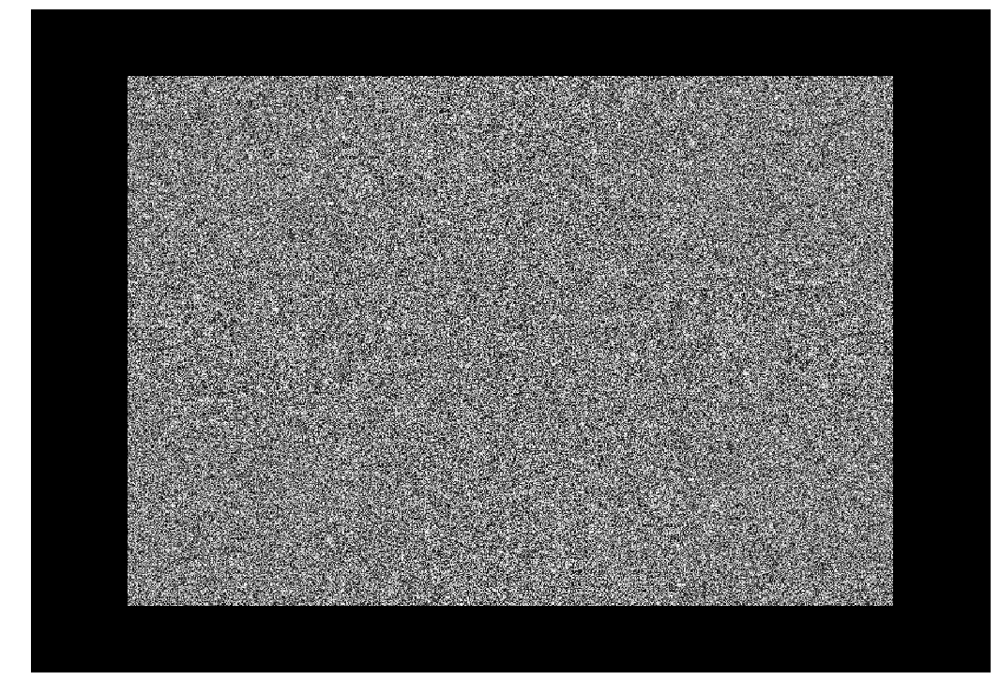

In [556]:
ishow(img_convolucionada_fft_mascara)

# IFFT e salvando Imagem

In [628]:
img_com_mensagem = np.fft.ifft2(img_convolucionada_fft_mascara)

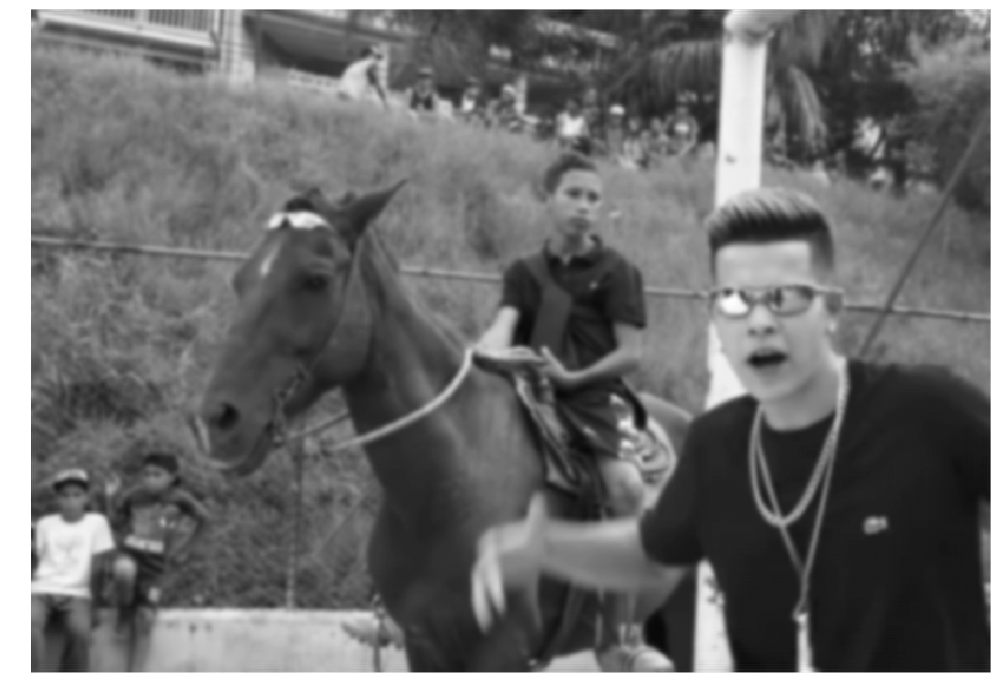

In [629]:
ishow(img_com_mensagem)

In [632]:
img_com_mensagem = np.asarray(abs(img_com_mensagem),np.uint8)
imageio.imwrite("./ImagemComMensagem.png",img_com_mensagem)

# Carregando *a mesma* Imagem e Mostrando Dominio Da Frequencia

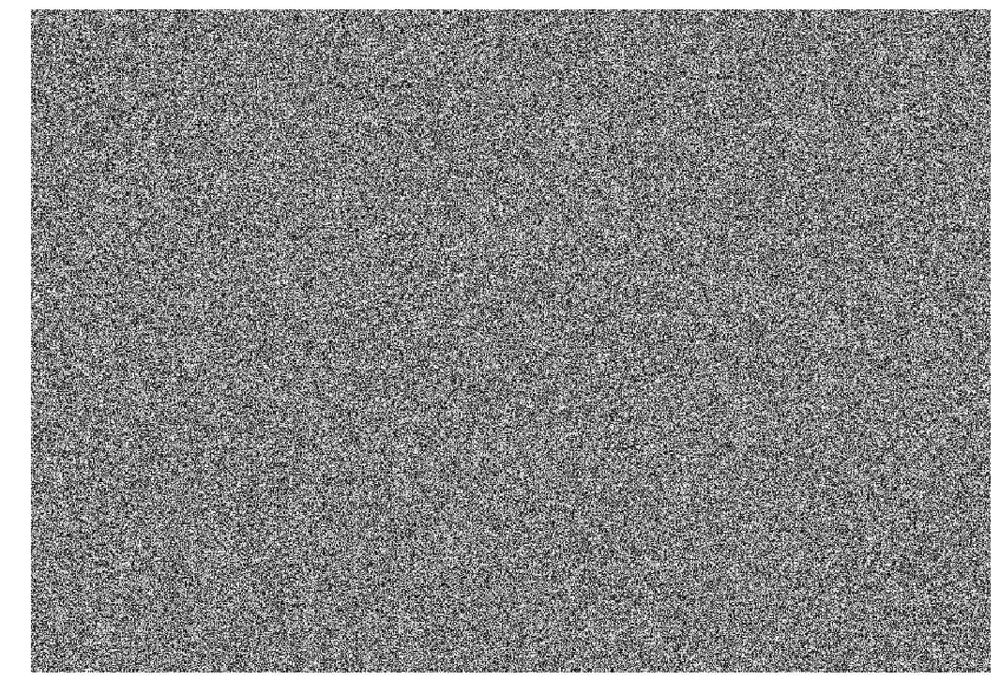

In [634]:
mesmaImagemCarregadaAcima = imageio.imread("./ImagemComMensagem.png")
mesmaImagemCarregadaAcima_fft = np.fft.fft2(mesmaImagemCarregadaAcima)
ishow(mesmaImagemCarregadaAcima_fft)

Note que o domínio das frequencias está completamente diferente do que deveria, de acordo com a imagem um pouco mais acima! Isso ocorre pelo arredondamento de Complex -> Uint8. 
Por esse motivo colocar uma mensagem no domínio das frequencias torna-se uma tarefa muito mais complexa do que nos propuzemos a resolver nesse trabalho

Ainda assim fizemos algumas tentativas para finalizar o trabalho de outra forma

## Tentativa 1
Basicamente pensamos em separar a parte REAL e parte Imaginária e fazer uma mistura com o Abs() do complexo

In [557]:
imagem_final_apos_esteganografia = np.fft.ifft2(img_convolucionada_fft_mascara)

In [610]:
real_imagem_final = np.real(imagem_final_apos_esteganografia)
imaginario_imagem_final = np.imag(imagem_final_apos_esteganografia)
absoluto_imagem_final = abs(imagem_final_apos_esteganografia)

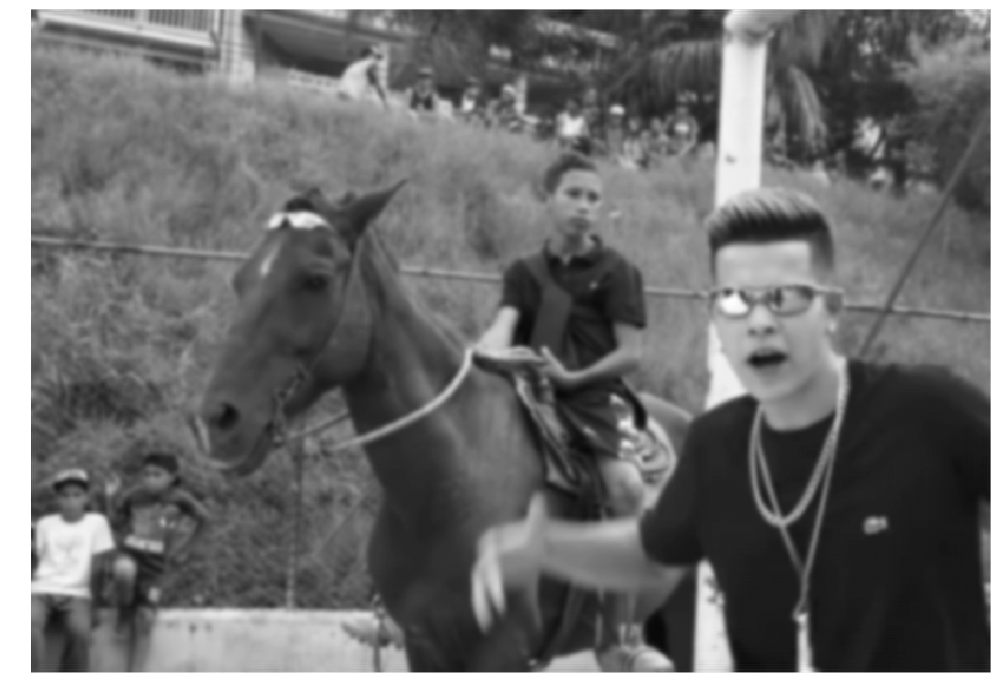

In [613]:
ishow(absoluto_imagem_final)

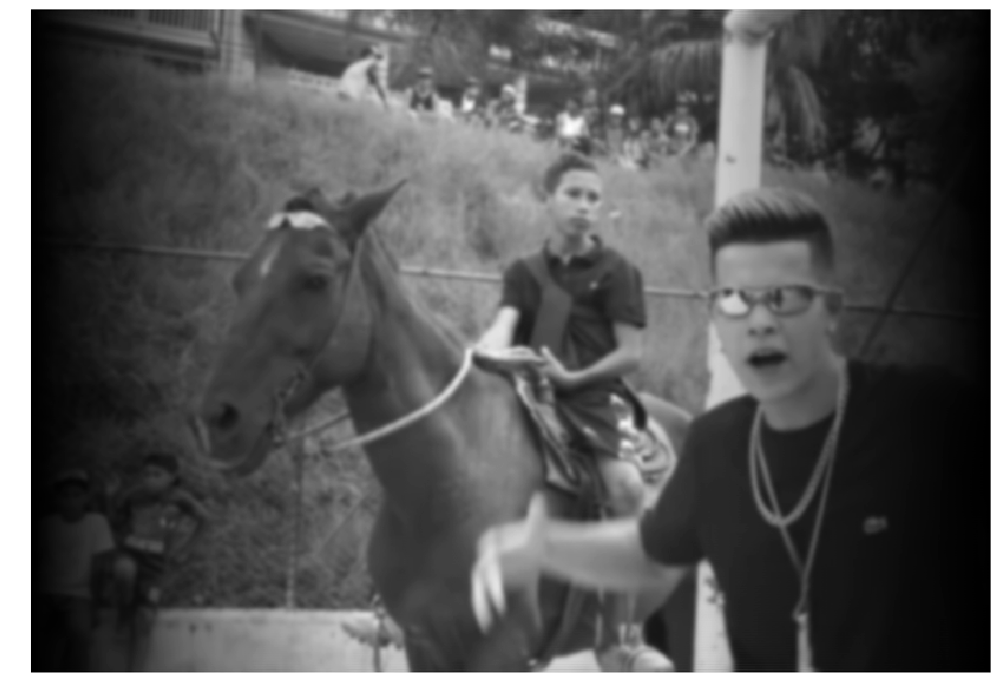

In [612]:
ishow(imaginario_imagem_final)

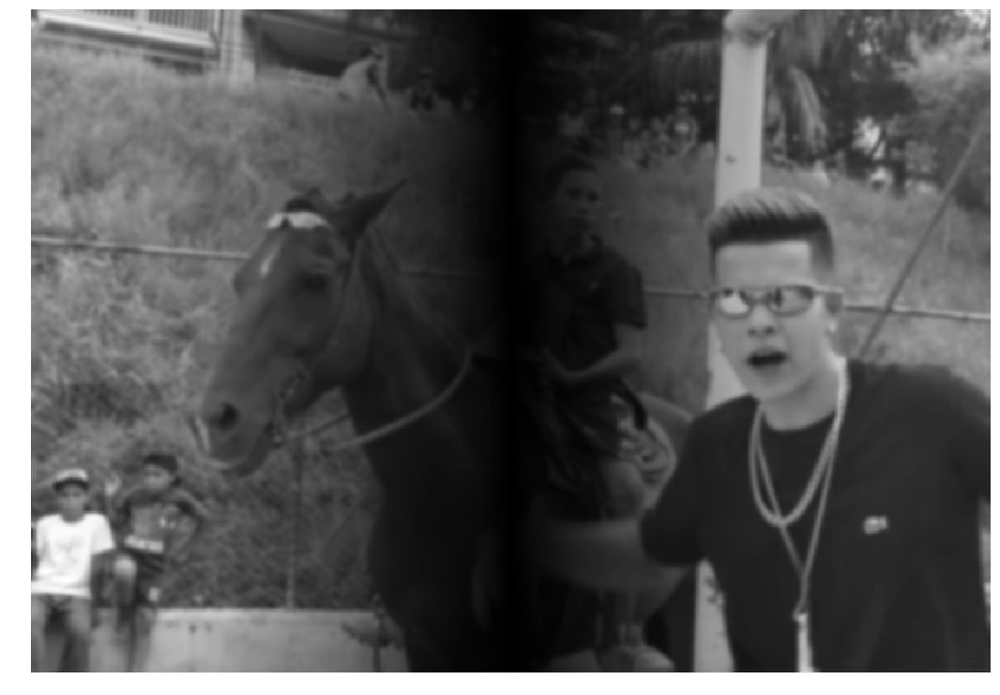

In [611]:
ishow(real_imagem_final)

In [635]:
resultado = np.zeros((imagem_final_apos_esteganografia.shape[0],imagem_final_apos_esteganografia.shape[1],3))

In [636]:
for i in range(0,resultado.shape[0]):
    for j in range(0,resultado.shape[1]):
#         L = R * 299/1000 + G * 587/1000 + B * 114/1000
        r = absoluto_imagem_final[i][j]
        g = bla[i][j]
        b = bla1[i][j]
        
        resultado[i][j] = (r,g,b)

/Users/kauemoraes/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  


In [637]:
resultado = np.asarray(resultado, np.uint8)

In [638]:
resultado.shape

(606, 877, 3)

In [639]:
bla = (imaginario_imagem_final + absoluto_imagem_final)/2

In [640]:
bla1 = (real_imagem_final + absoluto_imagem_final)/2

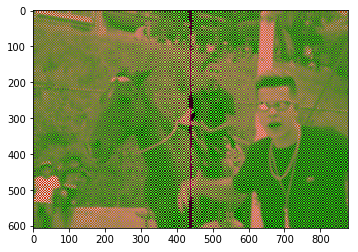

In [642]:
imshow(resultado)

# Tentativa 2
Aqui tentamos realizar o arredondamento separadamente das partes reais e imaginárias.

In [592]:
ft_fft = img_convolucionada_fft_mascara

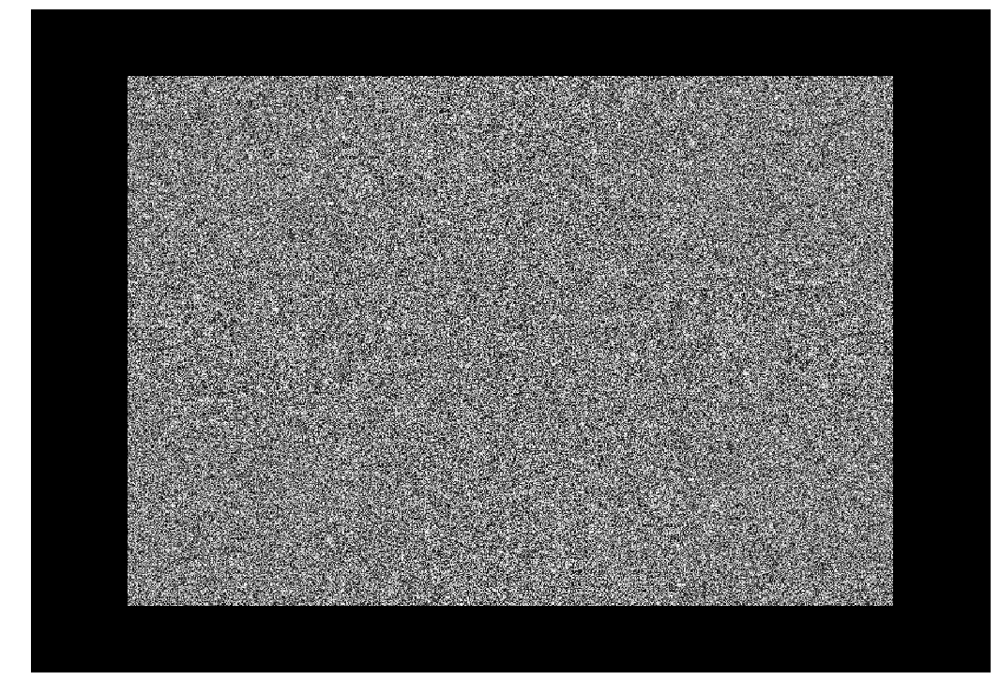

In [593]:
ishow(ft_fft)

In [594]:
ft = np.fft.ifft2(ft_fft)

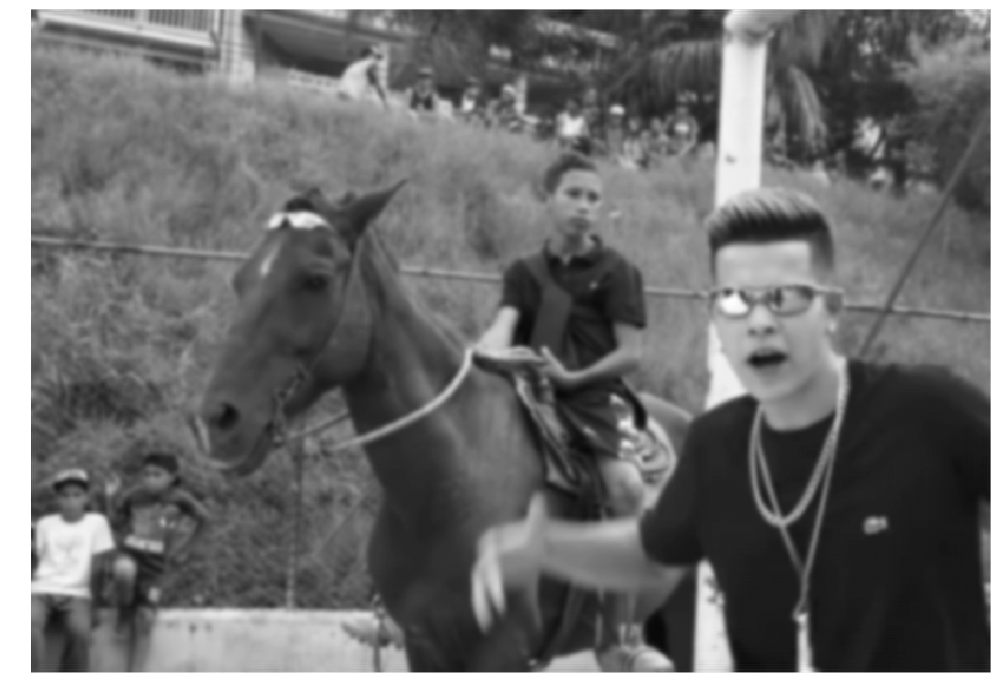

In [595]:
ishow(ft)

In [650]:
a = np.real(ft)
b = np.imag(ft)

In [651]:
a = np.asarray(a,np.uint8)
b = np.asarray(b,np.uint8)

In [652]:
bla = a + b*1j

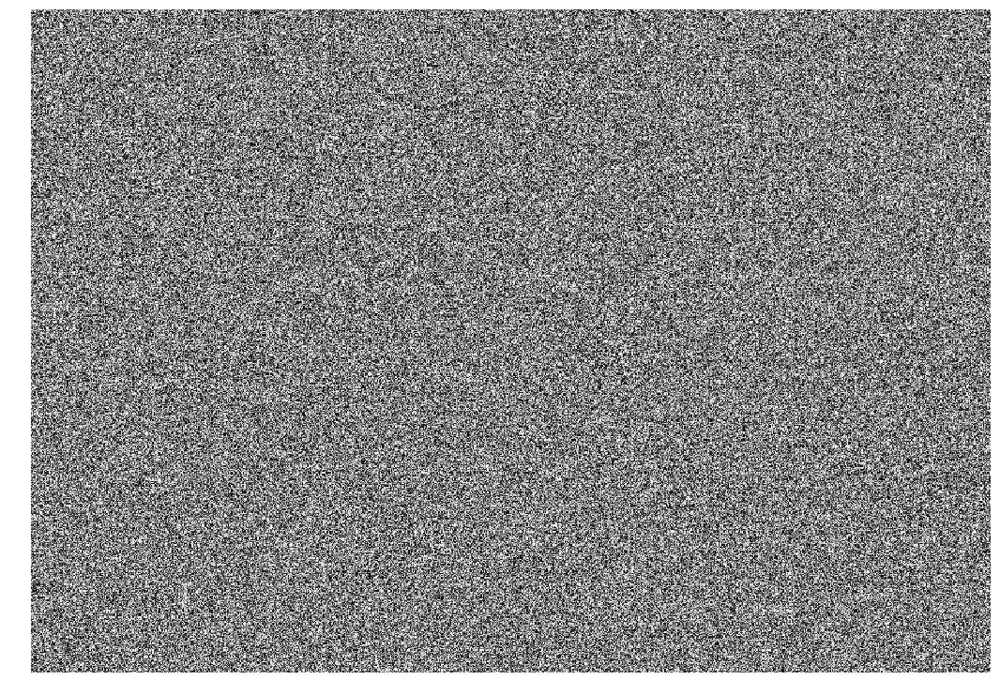

In [653]:
ishow(np.fft.fft2(bla))


Com essa simples demonstração na tentativa 2 fica claro como não é possível executar o nosso objetivo do trabalho.
### Motivos:
- Após a volta pelo IFFT, estamos no domínio da imagem novamente, porém com número complexos, o que torna impossível salvar em um arquivo sem a perda de informação
- A precisão necessária para conseguir voltar ao domínio das frequencias sem alteração da mensagem não é obtida com um 